# Beauty Cluster 
* 날씨와 상관관계가 높은 지역 선정 

In [1]:
import warnings
warnings.filterwarnings(action='ignore')

import pandas as pd 
import numpy as np
pd.set_option("max_rows", 500)
pd.set_option("max_columns", 500)
pd.set_option('float_format', '{:f}'.format)

import dataload

import os 
import datetime
from tqdm import tqdm 
from functools import reduce

In [2]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt 

plt.style.use('seaborn')
plt.rc('font', family='AppleGothic')
plt.rc('axes', unicode_minus=False)

In [3]:
buy_full = dataload.load_buy()
print(buy_full.shape)
buy_full.head()

(2056899, 6)


,date,sex,age,big_cat,sm_cat,qty
0,20180101,F,20,식품,가공란,37
1,20180101,F,30,식품,가공란,16
2,20180101,F,40,식품,가공란,9
3,20180101,F,50,식품,가공란,3
4,20180101,M,20,식품,가공란,13


In [4]:
beauty = pd.read_csv('beauty_tsclustering_0606.csv', encoding='cp949')
weather = pd.read_csv('weather_final.csv', encoding='cp949')

beauty.shape, weather.shape

((131, 367), (11680, 27))

In [5]:
tqdm.pandas()
buy_full["date"] = buy_full["date"].progress_apply(lambda x : pd.to_datetime(str(x), format='%Y-%m-%d'))
weather["날짜"] = weather["날짜"].progress_apply(lambda x : pd.to_datetime(x))

100%|██████████| 11680/11680 [00:00<00:00, 15252.22it/s]


In [6]:
def cluster_buy_df(c) : 
    clusterdf = beauty[beauty["cluster"] == c]
    df = buy_full[buy_full.sm_cat.isin(list(clusterdf["sm_cat"]))] 
    df = df.groupby('date').sum('qty').reset_index()[["date","qty"]]
    return df

In [7]:
def weather_correlation(buy_df, loc) : 
    df = weather[weather.지역 == loc].reset_index(drop=True)
    df = df.merge(buy_df, left_on="날짜", right_on="date")
    df = df.drop(['연', '월', '일', '분기', '요일', '공휴일명', '공휴일여부', '주말여부', '계절', '폭염여부', '강수여부'], axis=1)
    co = dict(df.corr()["qty"])
    return co

In [8]:
def display_weather_correlation(buy_df) : 
    weathercorrelation = dict()
    for loc in weather.지역.unique() : 
        weathercorrelation[loc] = weather_correlation(buy_df, loc)
    
    tmp = pd.DataFrame(weathercorrelation)
    tmp = tmp.drop(['지점번호', 'qty'], axis=0)
    return tmp

In [9]:
def weather_qty_graph(buy_df, loc) : 
    df = weather[weather.지역 == loc].reset_index(drop=True)
    df = df.merge(buy_df, left_on="날짜", right_on="date")
    df = df.drop(['날짜', '지점번호', '지역', '연', '월', '일', '분기', '요일', '공휴일명', '공휴일여부', '주말여부', '계절', '폭염여부', '강수여부'], axis=1)

    for i, w in enumerate([col for col in list(df.columns) if col not in ['date', 'qty']]) : 
        plt.figure(i)
        plt.figure(figsize=(15,3))
        
        sns.lineplot(x='date', y='qty', data=df)
        ax2 = plt.twinx()
        sns.lineplot(x='date', y=w, data=df, ax=ax2, color='g')
        plt.title(f'{loc} {w}')
        plt.show()

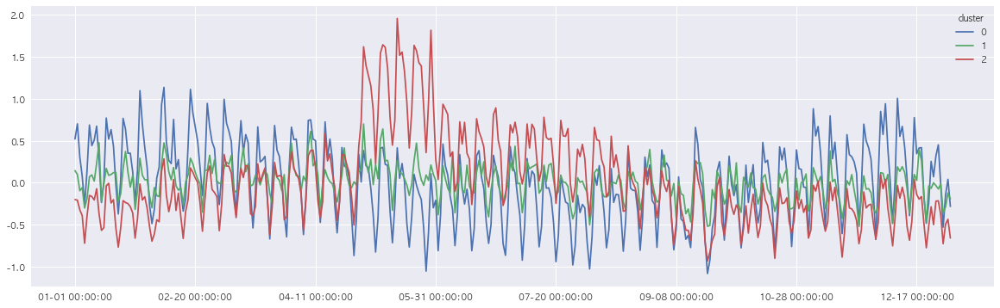

In [10]:
plt.rcParams["figure.figsize"]=(20,6)
beauty.groupby(['cluster']).mean().T.plot()
plt.show()

# 1. Cluster0 : 겨울
* 서울 + 천안 (기온, 미세먼지 상관계수 높음), 광주 (기온, 강수량, 미세먼지)

In [11]:
display_weather_correlation(cluster_buy_df(0))

,강릉,인천,수원,안동,울산,제주,천안,청주,대구,창원,여수,부산,서울,광주,전주,대전
평균기온,-0.424267,-0.439638,-0.449289,-0.456940,-0.432128,-0.429954,-0.458836,-0.448433,-0.441472,-0.439164,-0.431773,-0.423631,-0.446540,-0.457251,-0.451457,-0.451043
최고기온,-0.400436,-0.439281,-0.447488,-0.451491,-0.418127,-0.427998,-0.451454,-0.447723,-0.430621,-0.430063,-0.426567,-0.411299,-0.440752,-0.454330,-0.446375,-0.446246
최저기온,-0.425685,-0.438179,-0.446976,-0.450110,-0.436155,-0.422863,-0.448734,-0.446559,-0.442370,-0.436831,-0.427760,-0.422651,-0.446672,-0.447653,-0.445022,-0.448058
일별강수량,-0.035729,-0.081018,-0.065797,-0.053208,-0.065040,-0.025369,-0.060696,-0.062188,-0.091530,-0.091600,-0.090024,-0.100377,-0.094674,-0.094970,-0.080349,-0.071981
1시간최대강수량,-0.046165,-0.069446,-0.071584,-0.045445,-0.072993,-0.018770,-0.050512,-0.055874,-0.102570,-0.094407,-0.085794,-0.090857,-0.095871,-0.094486,-0.081981,-0.062537
평균풍속,0.162601,0.093967,-0.088626,-0.033802,0.054345,0.075413,-0.132602,-0.229142,-0.028576,-0.028109,0.088316,-0.069382,0.120543,-0.072383,0.002044,-0.158426
PM10,0.021448,0.211806,0.192138,0.104454,0.030731,0.042141,0.251139,0.202952,0.165700,0.086522,0.070736,0.063571,0.192128,0.181471,0.179972,0.192323
PM25,0.093475,0.175776,0.194771,0.113394,-0.007519,0.031759,0.238331,0.206645,0.180210,0.077903,0.096477,0.079840,0.166891,0.171383,0.205167,0.212188
1시간최대습도,-0.248601,-0.180213,-0.105510,-0.209589,-0.248172,-0.238995,-0.094128,-0.071976,-0.167638,-0.340114,-0.322621,-0.294879,-0.178326,-0.252120,-0.270240,-0.162220
일조시간합,0.006687,-0.076528,-0.071350,-0.068860,-0.028025,-0.158859,-0.124607,-0.112036,-0.019962,0.029109,-0.055005,-0.002488,-0.072040,-0.075052,-0.093576,-0.098590


<Figure size 1440x432 with 0 Axes>

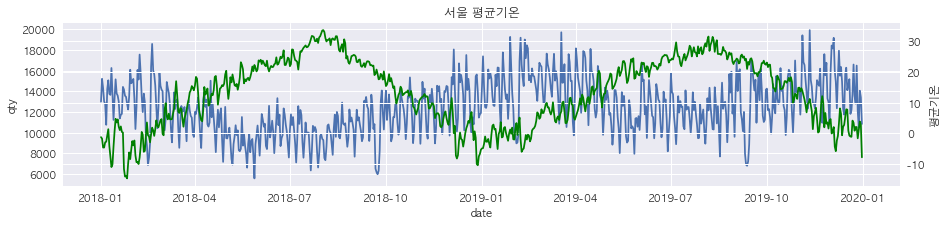

<Figure size 1440x432 with 0 Axes>

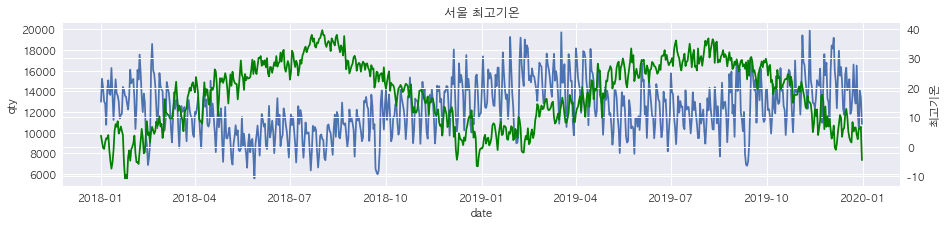

<Figure size 1440x432 with 0 Axes>

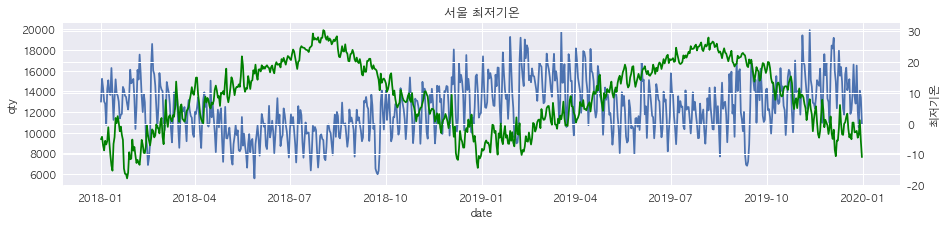

<Figure size 1440x432 with 0 Axes>

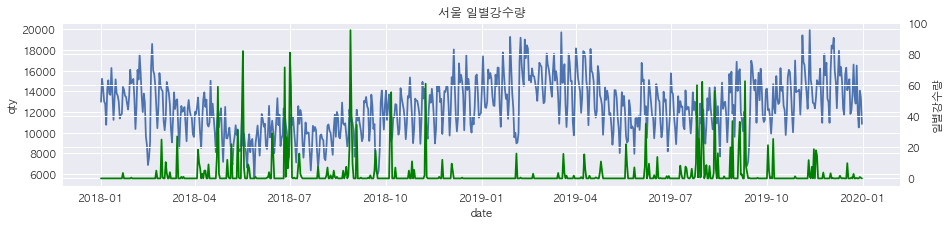

<Figure size 1440x432 with 0 Axes>

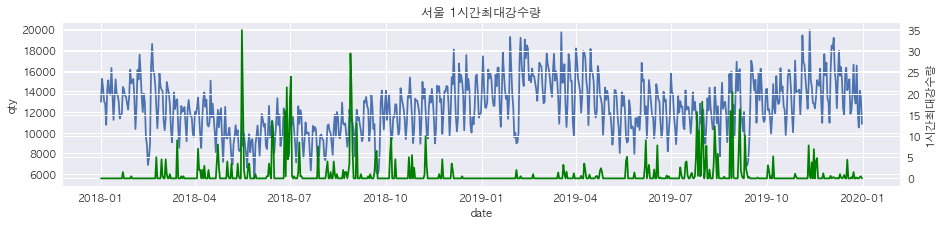

<Figure size 1440x432 with 0 Axes>

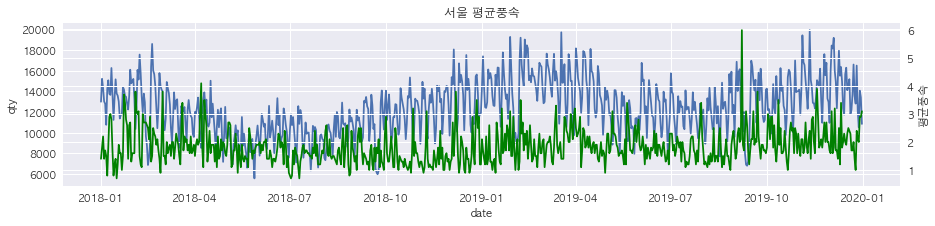

<Figure size 1440x432 with 0 Axes>

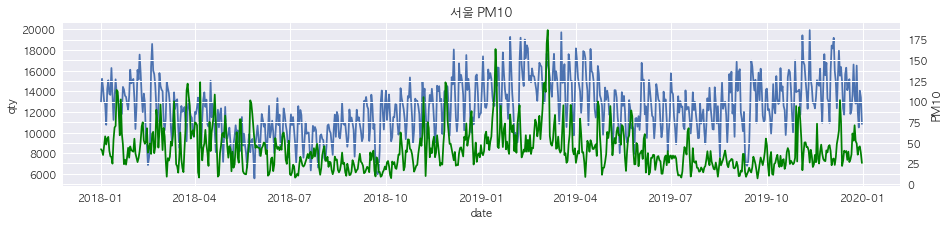

<Figure size 1440x432 with 0 Axes>

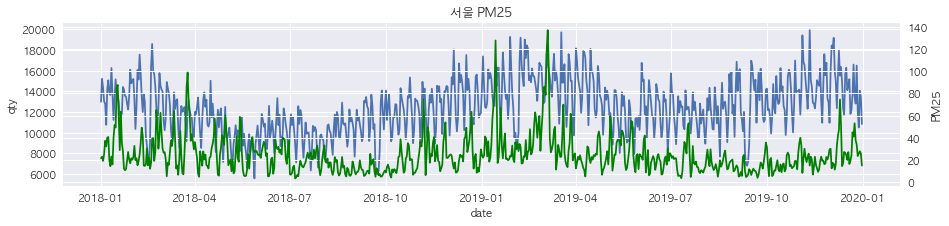

<Figure size 1440x432 with 0 Axes>

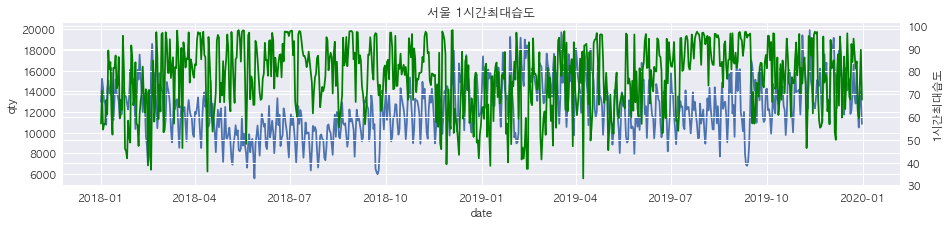

<Figure size 1440x432 with 0 Axes>

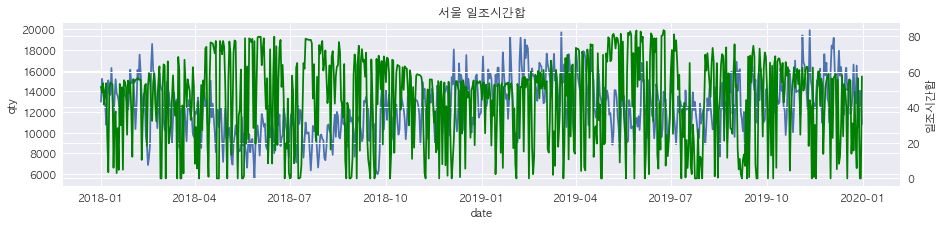

<Figure size 1440x432 with 0 Axes>

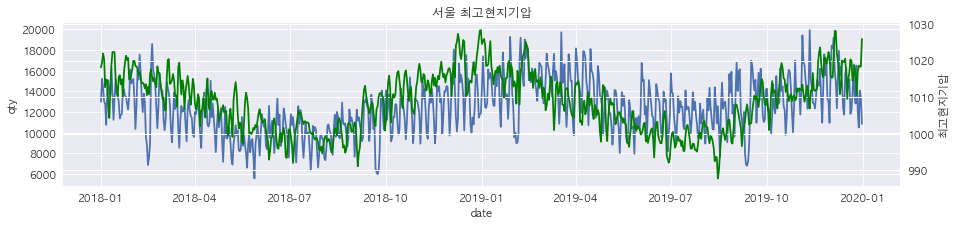

<Figure size 1440x432 with 0 Axes>

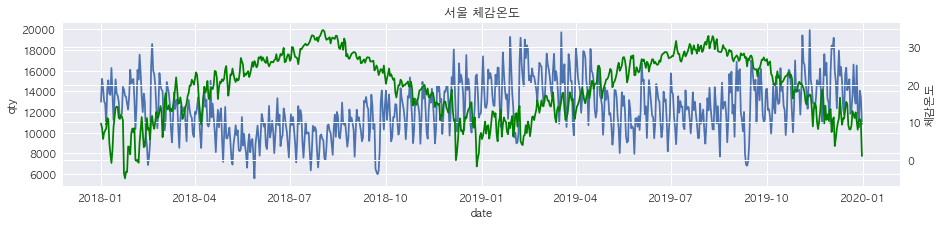

<Figure size 1440x432 with 0 Axes>

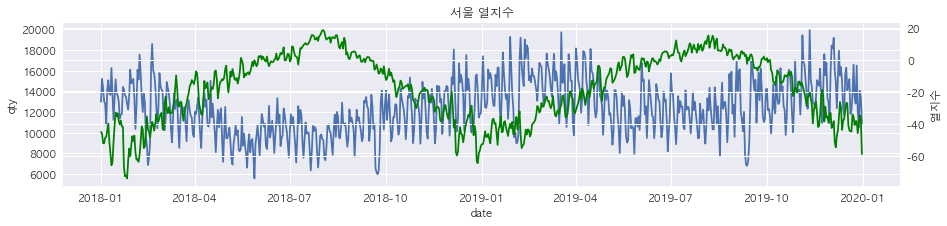

In [12]:
weather_qty_graph(cluster_buy_df(0), "서울")

<Figure size 1440x432 with 0 Axes>

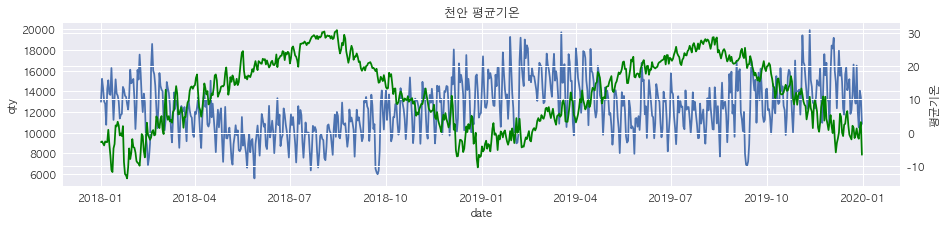

<Figure size 1440x432 with 0 Axes>

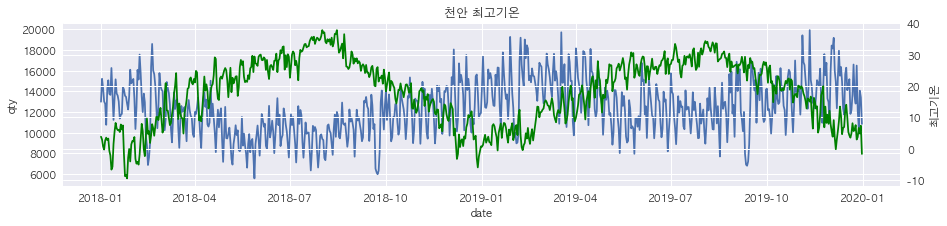

<Figure size 1440x432 with 0 Axes>

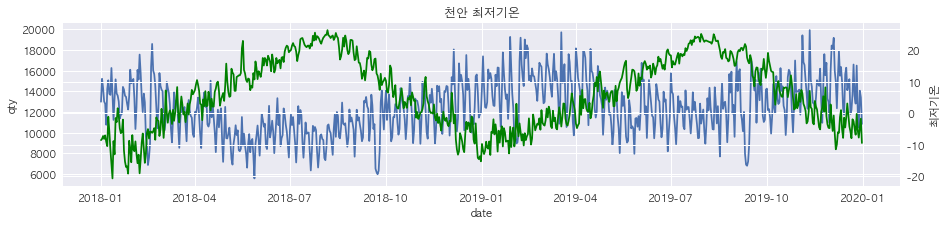

<Figure size 1440x432 with 0 Axes>

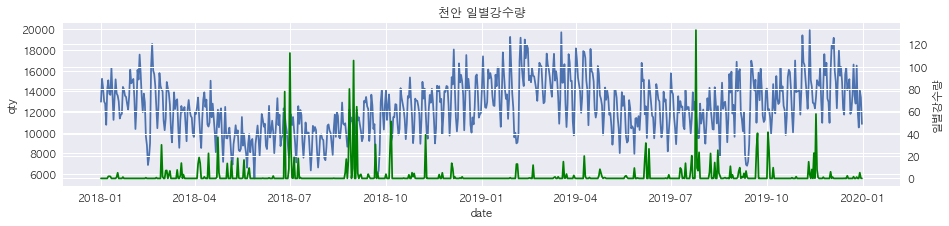

<Figure size 1440x432 with 0 Axes>

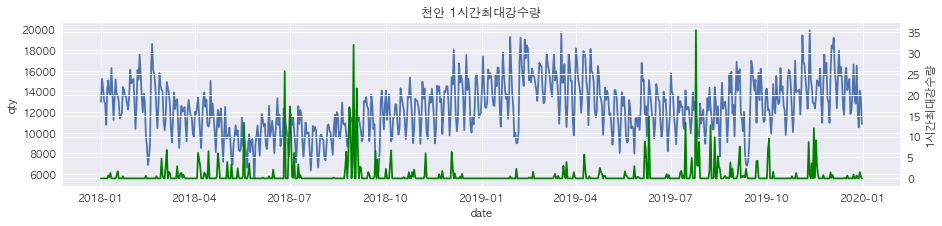

<Figure size 1440x432 with 0 Axes>

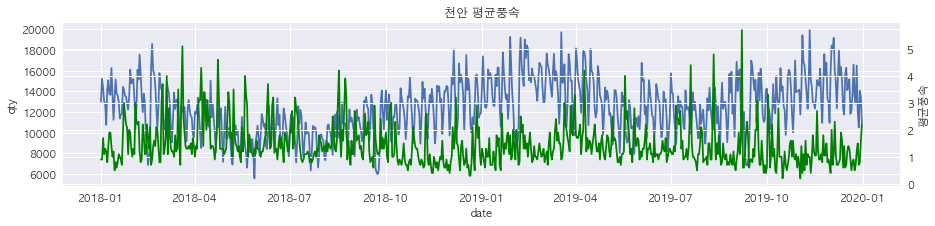

<Figure size 1440x432 with 0 Axes>

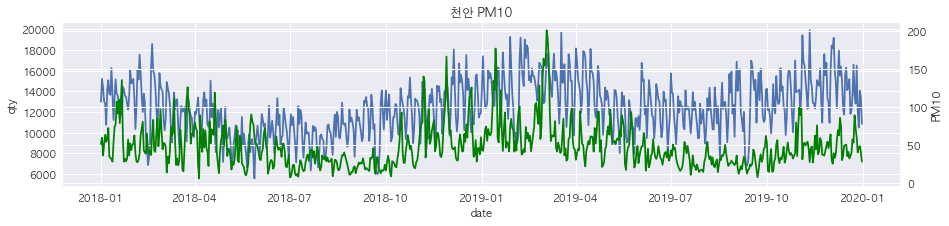

<Figure size 1440x432 with 0 Axes>

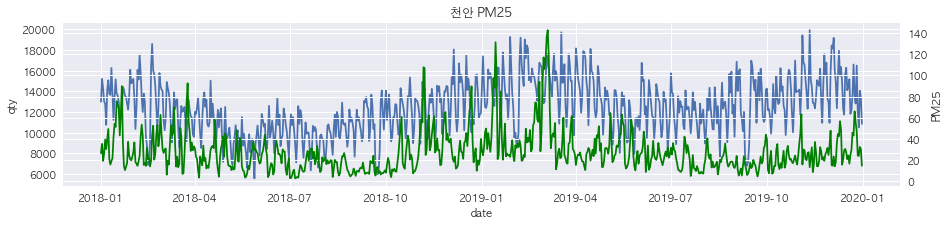

<Figure size 1440x432 with 0 Axes>

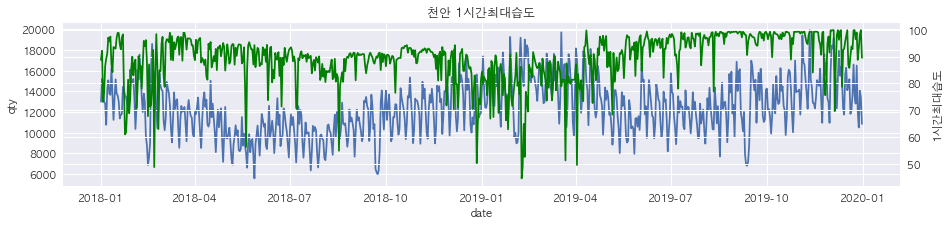

<Figure size 1440x432 with 0 Axes>

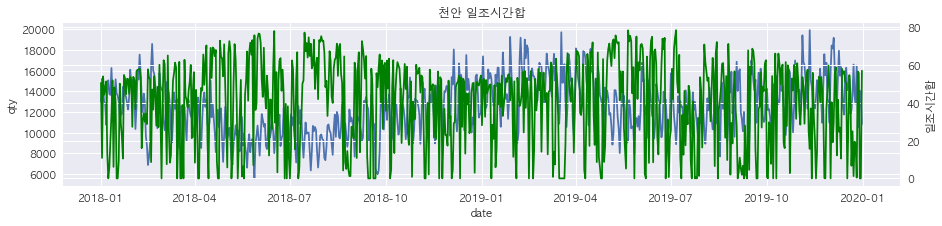

<Figure size 1440x432 with 0 Axes>

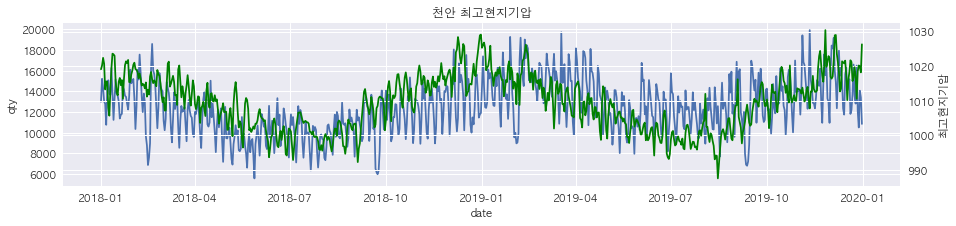

<Figure size 1440x432 with 0 Axes>

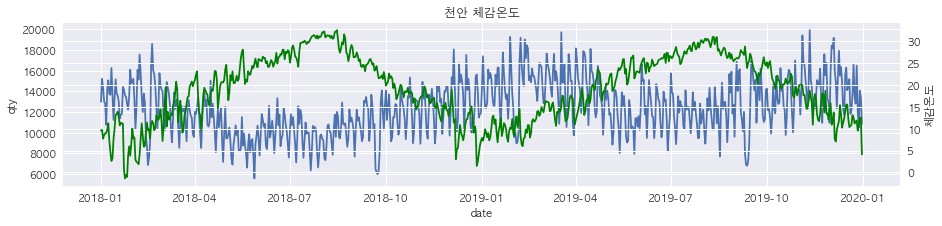

<Figure size 1440x432 with 0 Axes>

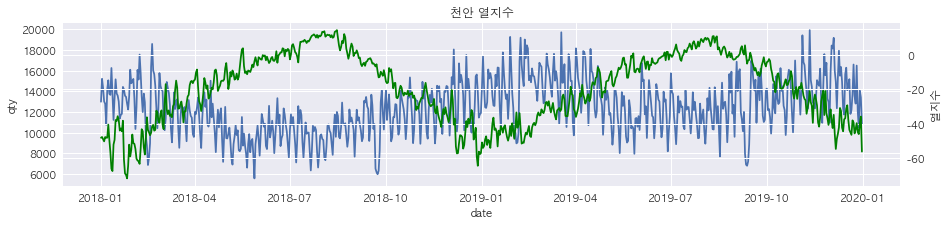

In [13]:
weather_qty_graph(cluster_buy_df(0), "천안")

<Figure size 1440x432 with 0 Axes>

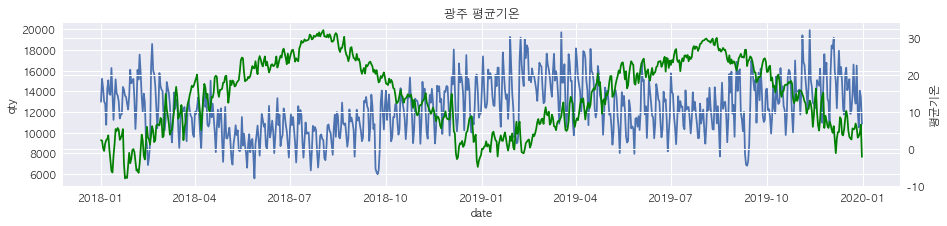

<Figure size 1440x432 with 0 Axes>

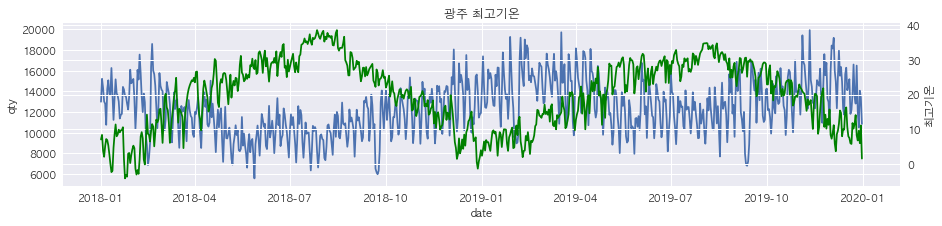

<Figure size 1440x432 with 0 Axes>

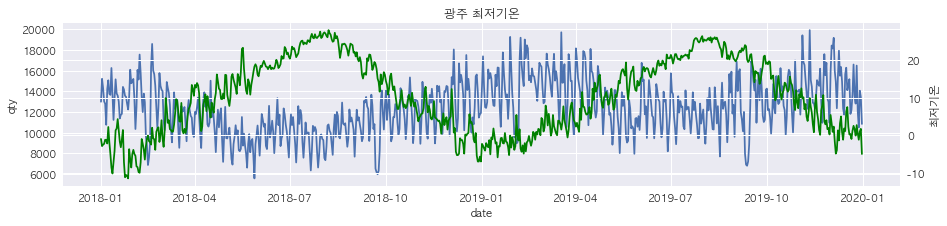

<Figure size 1440x432 with 0 Axes>

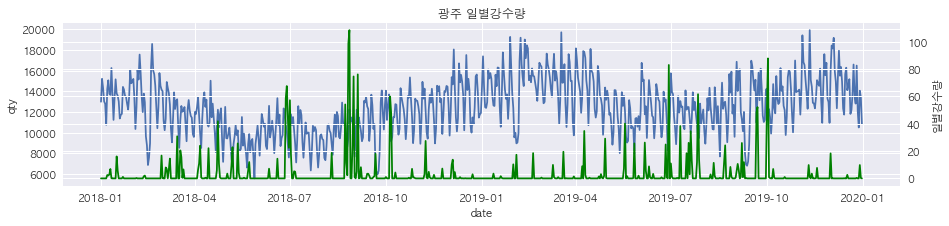

<Figure size 1440x432 with 0 Axes>

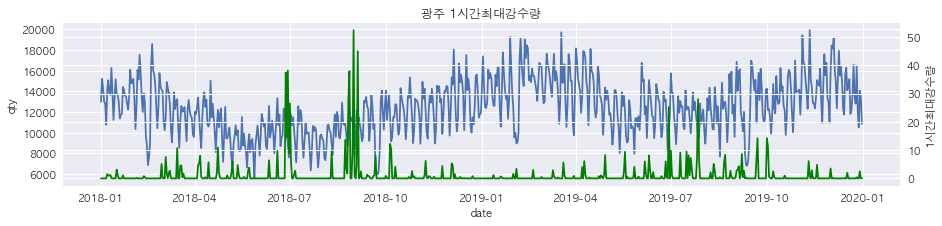

<Figure size 1440x432 with 0 Axes>

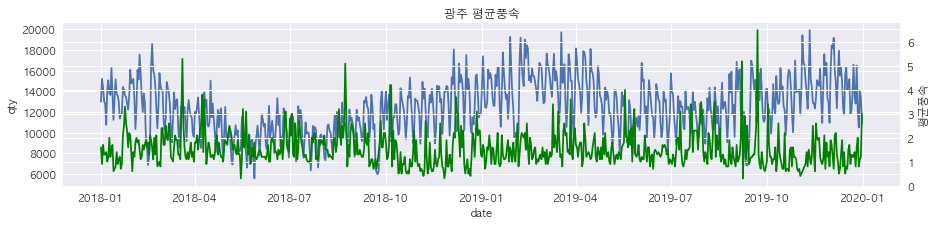

<Figure size 1440x432 with 0 Axes>

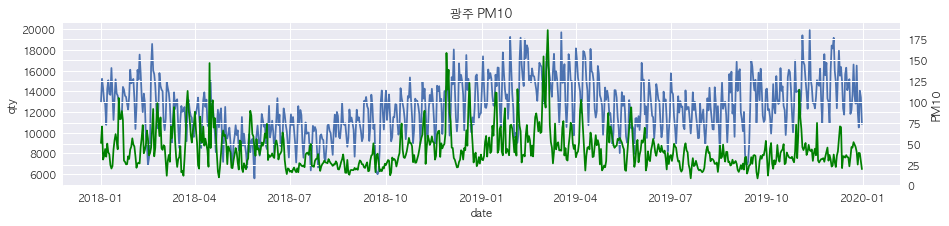

<Figure size 1440x432 with 0 Axes>

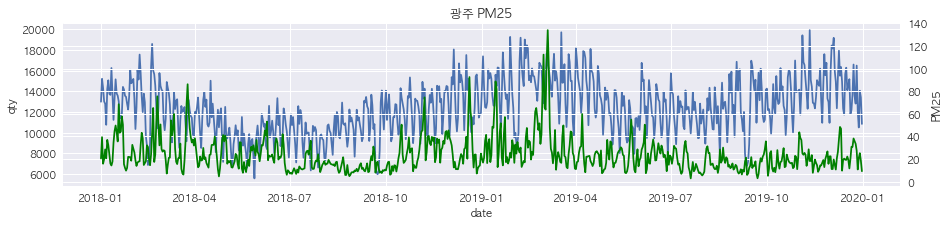

<Figure size 1440x432 with 0 Axes>

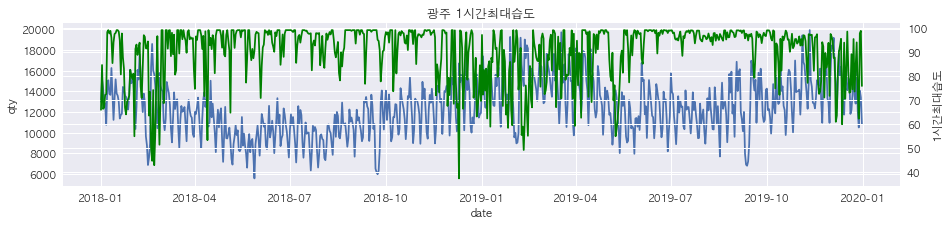

<Figure size 1440x432 with 0 Axes>

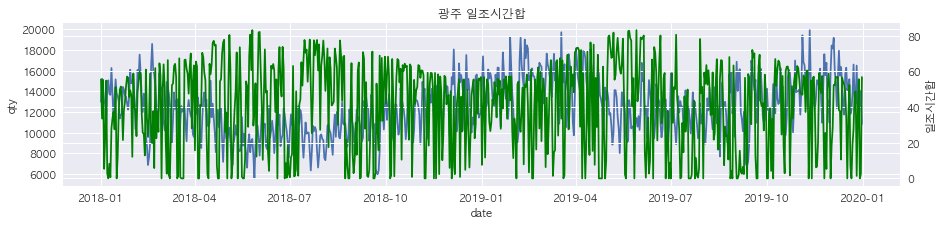

<Figure size 1440x432 with 0 Axes>

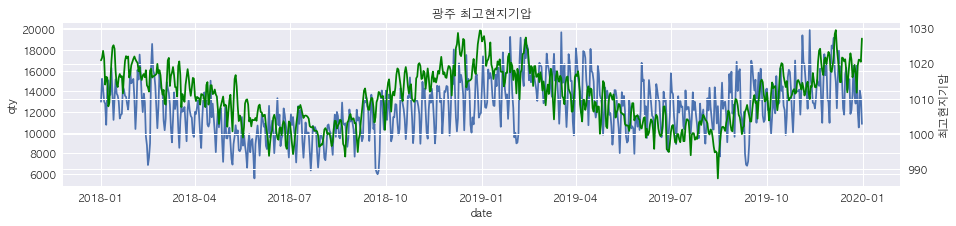

<Figure size 1440x432 with 0 Axes>

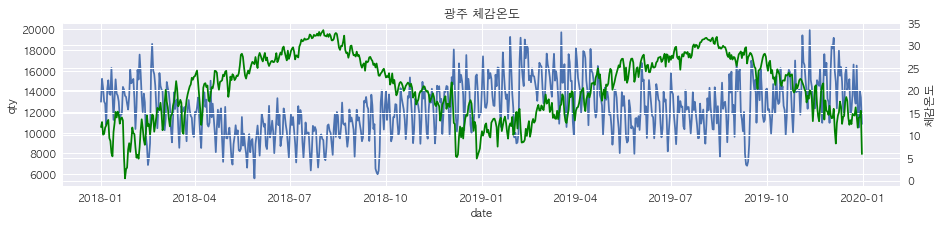

<Figure size 1440x432 with 0 Axes>

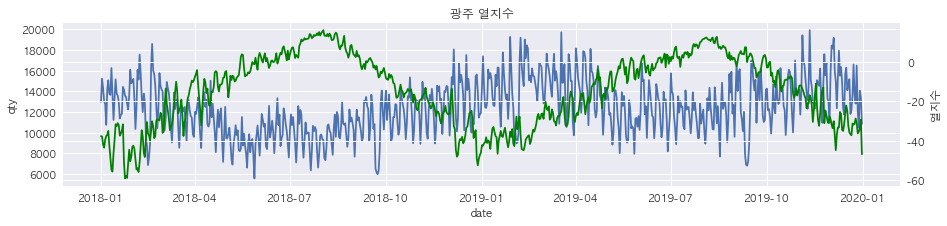

In [14]:
weather_qty_graph(cluster_buy_df(0), "광주")

# 2. Cluster1 : 스테디셀러  
* 상관관계 거의 없음 .. 
* 서울 + 부산 (기온, 강수량, 풍속, 미먼 모두 높음), 제주 (대부분 제일 높음, but 일조시간 엄청 낮음) / 여수 (제주도랑 비슷!) 

In [15]:
display_weather_correlation(cluster_buy_df(1))

,강릉,인천,수원,안동,울산,제주,천안,청주,대구,창원,여수,부산,서울,광주,전주,대전
평균기온,-0.073183,-0.089820,-0.078167,-0.071495,-0.080432,-0.112118,-0.076700,-0.072315,-0.067068,-0.084319,-0.101090,-0.097817,-0.073493,-0.091050,-0.089687,-0.073833
최고기온,-0.063990,-0.082799,-0.066289,-0.071028,-0.077127,-0.108974,-0.073439,-0.068792,-0.064064,-0.069521,-0.097744,-0.099523,-0.064761,-0.082324,-0.082268,-0.069901
최저기온,-0.088356,-0.090678,-0.082634,-0.082026,-0.084862,-0.110586,-0.084643,-0.079398,-0.075822,-0.092383,-0.099963,-0.094431,-0.081190,-0.094932,-0.091786,-0.082183
일별강수량,0.022931,-0.017980,-0.014903,-0.015359,-0.027542,-0.026203,-0.028771,-0.018833,-0.043815,-0.029020,-0.027007,-0.033198,-0.015965,-0.060519,-0.026581,0.005745
1시간최대강수량,0.033229,0.005872,-0.020402,-0.009721,0.003070,-0.022324,-0.007311,-0.013606,-0.025673,-0.020854,-0.013637,-0.003964,-0.014745,-0.064010,-0.026150,0.039189
평균풍속,0.045689,0.025749,0.025820,0.067660,0.023800,0.045739,0.027287,0.016037,0.049296,-0.004663,0.057293,0.056483,0.038859,0.028317,0.044508,0.041608
PM10,0.039346,0.087261,0.085046,0.090319,0.086005,0.029886,0.087569,0.053769,0.052007,0.061041,0.051420,0.091375,0.099110,0.074416,0.049116,0.060879
PM25,0.081601,0.081433,0.073194,0.082193,0.106327,0.054497,0.084838,0.050420,0.057982,0.086385,0.088554,0.124045,0.092563,0.070566,0.047306,0.062038
1시간최대습도,-0.069354,-0.015007,-0.066846,-0.080783,-0.058976,-0.059763,-0.049603,-0.077504,-0.085455,-0.072608,-0.027163,-0.042449,-0.089509,-0.088939,-0.091561,-0.114703
일조시간합,0.059761,0.039962,0.039261,0.054275,0.019867,0.009091,0.031582,0.022601,0.045997,0.039206,0.029771,0.021130,0.039444,0.035314,0.041759,0.024004


<Figure size 1440x432 with 0 Axes>

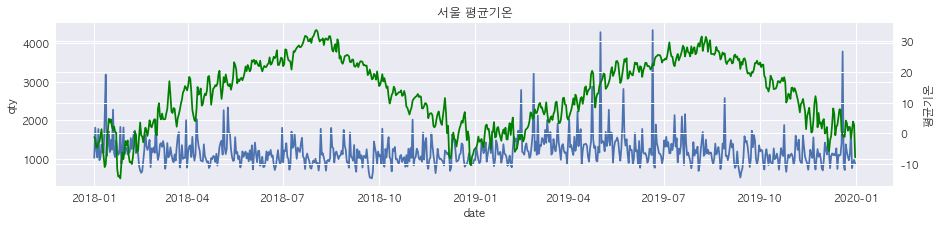

<Figure size 1440x432 with 0 Axes>

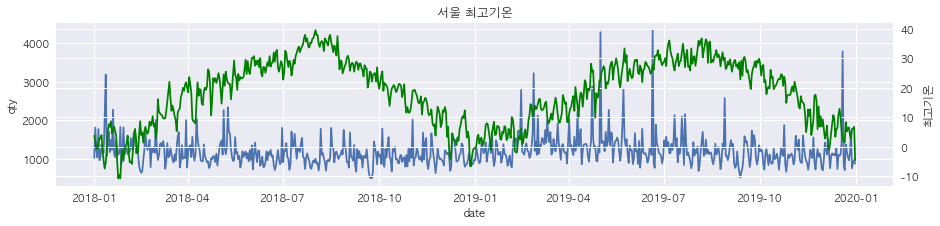

<Figure size 1440x432 with 0 Axes>

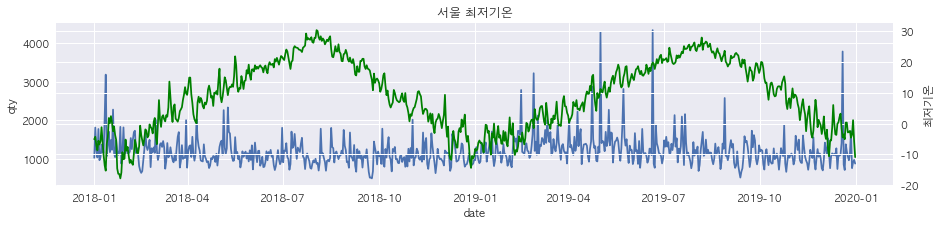

<Figure size 1440x432 with 0 Axes>

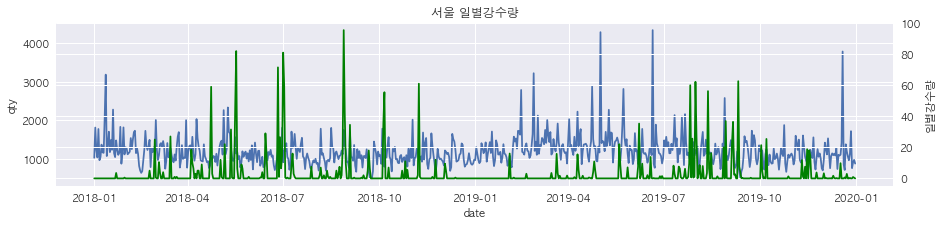

<Figure size 1440x432 with 0 Axes>

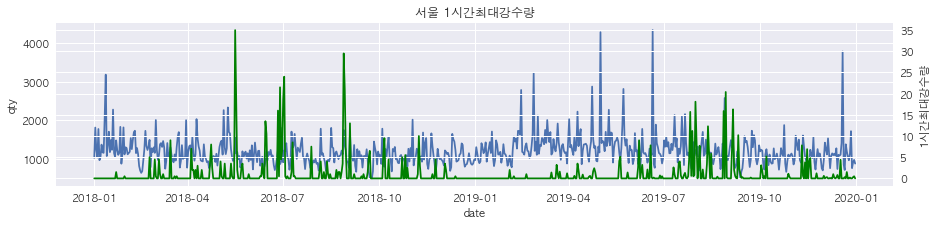

<Figure size 1440x432 with 0 Axes>

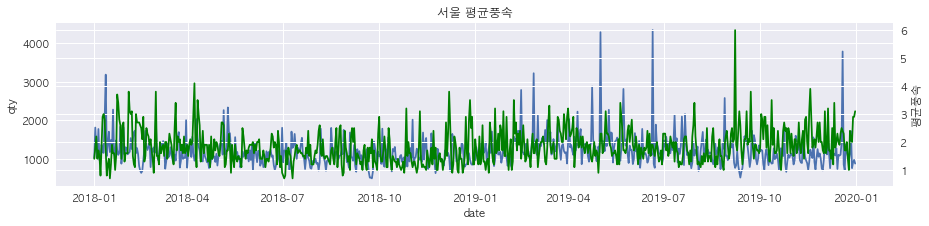

<Figure size 1440x432 with 0 Axes>

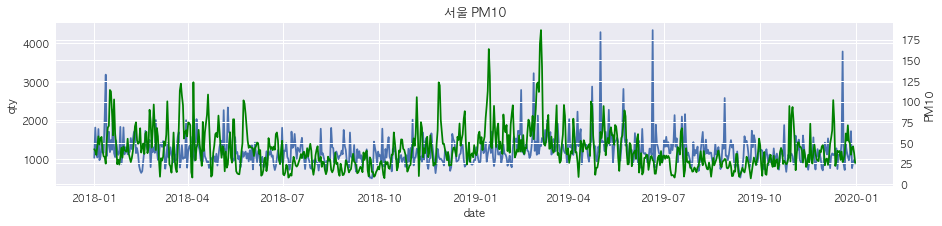

<Figure size 1440x432 with 0 Axes>

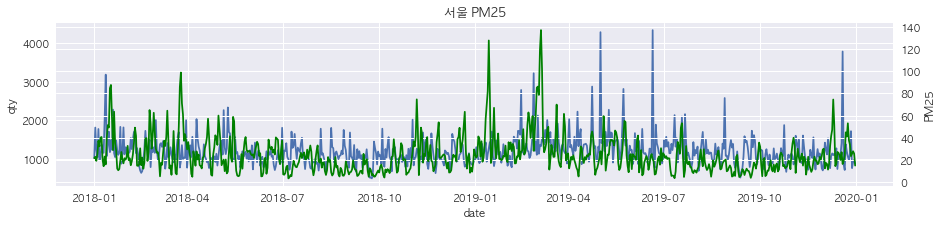

<Figure size 1440x432 with 0 Axes>

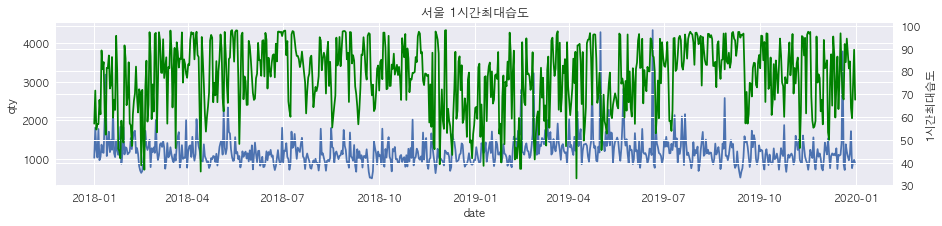

<Figure size 1440x432 with 0 Axes>

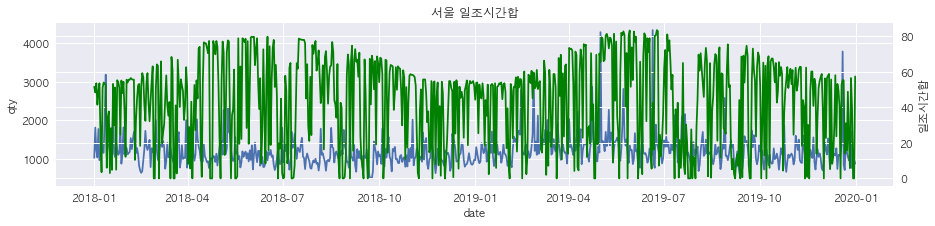

<Figure size 1440x432 with 0 Axes>

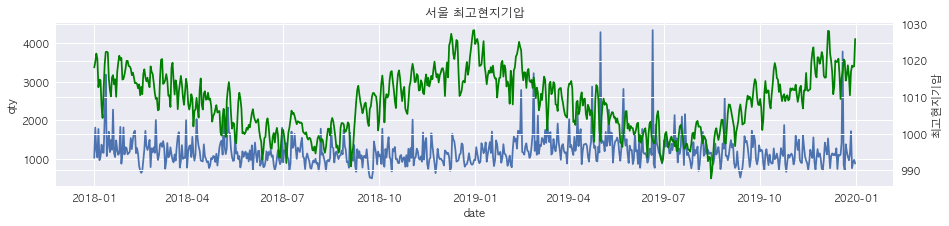

<Figure size 1440x432 with 0 Axes>

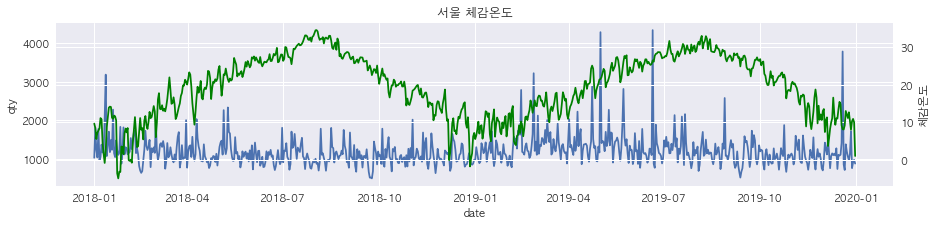

<Figure size 1440x432 with 0 Axes>

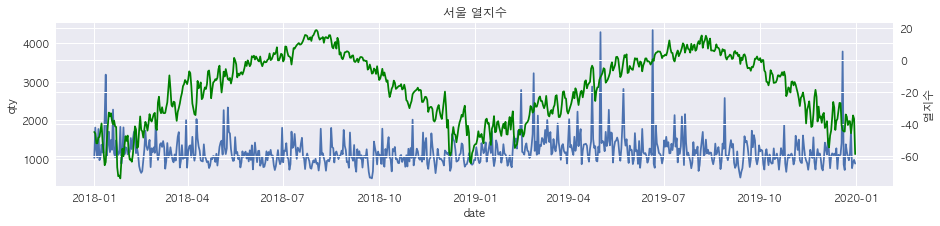

In [20]:
weather_qty_graph(cluster_buy_df(1), "서울")

<Figure size 1440x432 with 0 Axes>

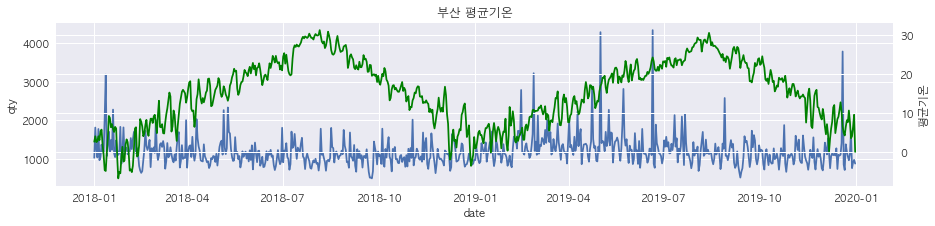

<Figure size 1440x432 with 0 Axes>

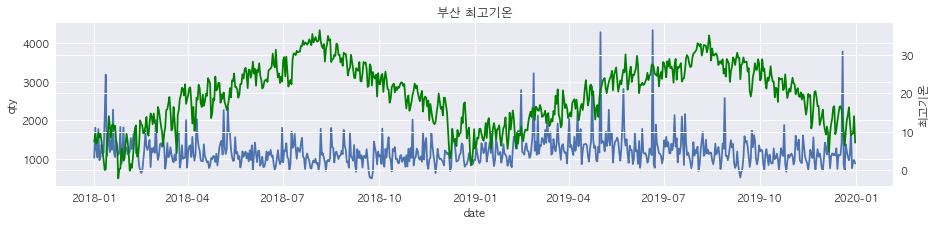

<Figure size 1440x432 with 0 Axes>

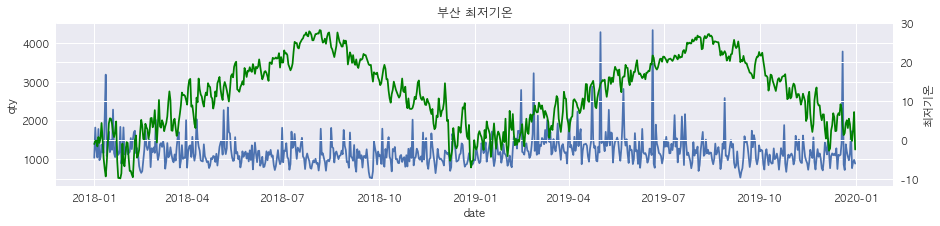

<Figure size 1440x432 with 0 Axes>

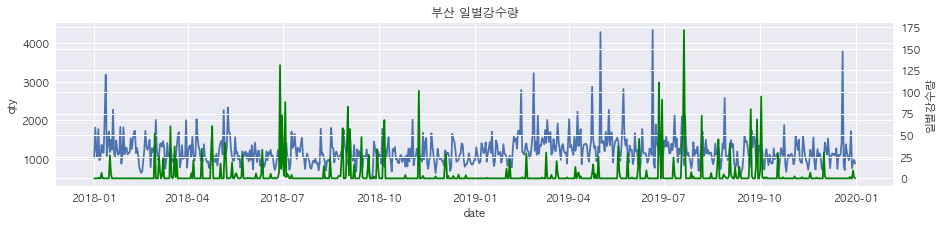

<Figure size 1440x432 with 0 Axes>

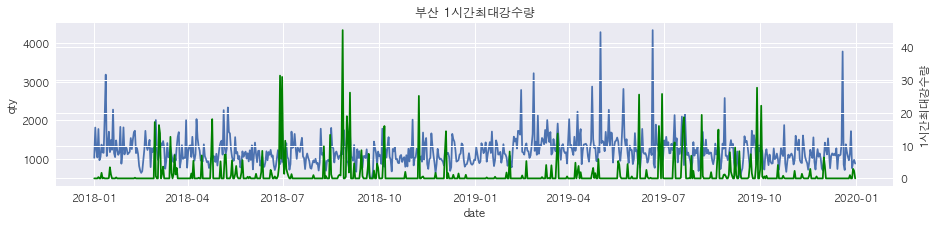

<Figure size 1440x432 with 0 Axes>

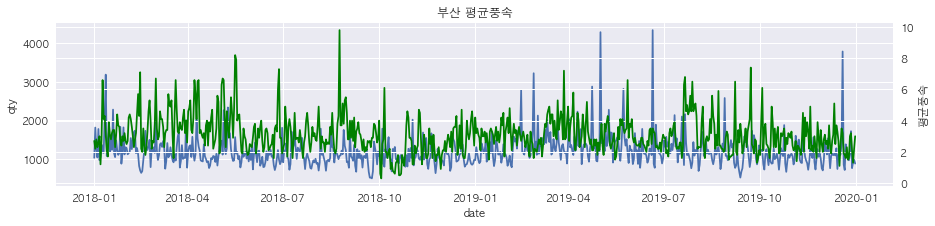

<Figure size 1440x432 with 0 Axes>

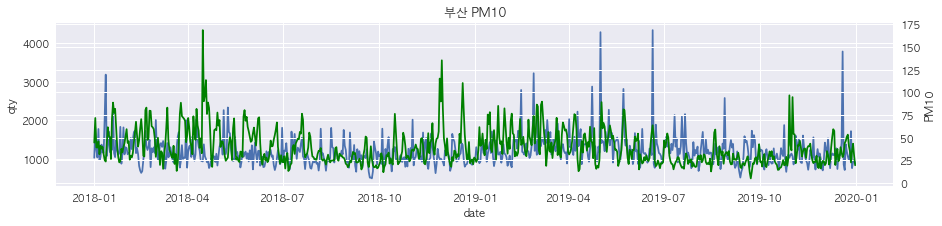

<Figure size 1440x432 with 0 Axes>

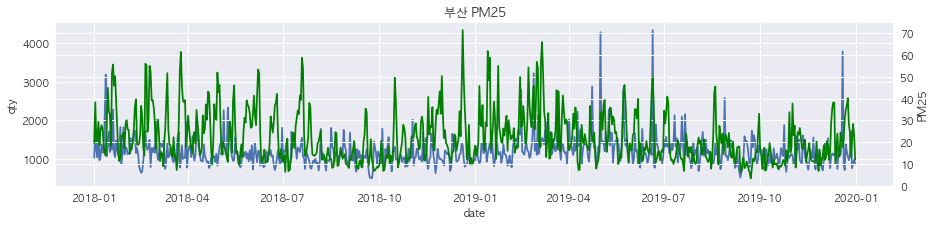

<Figure size 1440x432 with 0 Axes>

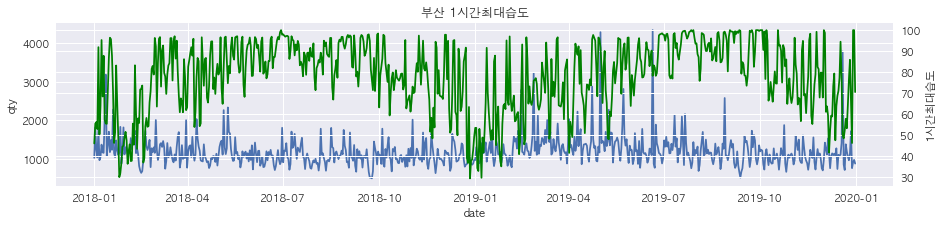

<Figure size 1440x432 with 0 Axes>

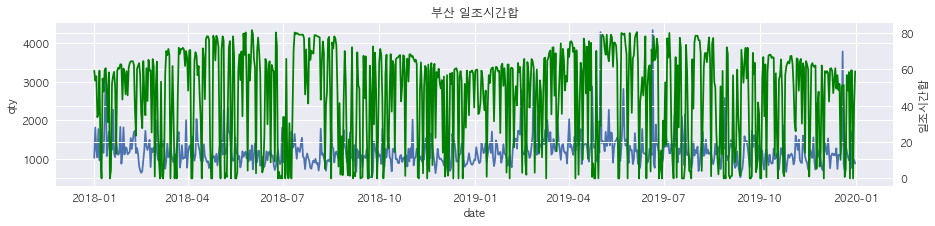

<Figure size 1440x432 with 0 Axes>

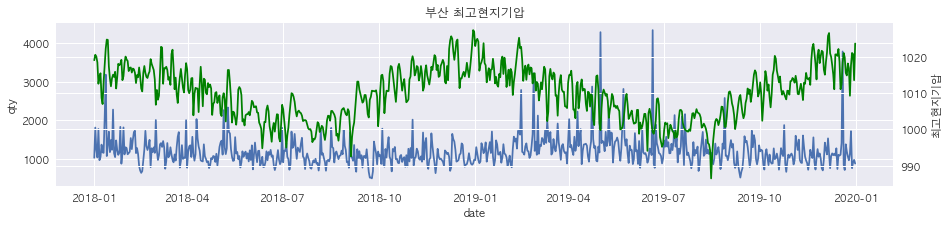

<Figure size 1440x432 with 0 Axes>

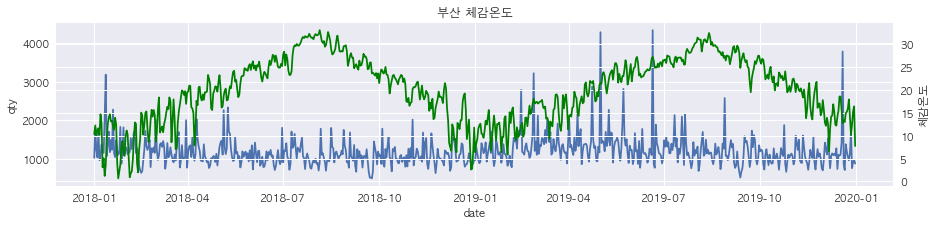

<Figure size 1440x432 with 0 Axes>

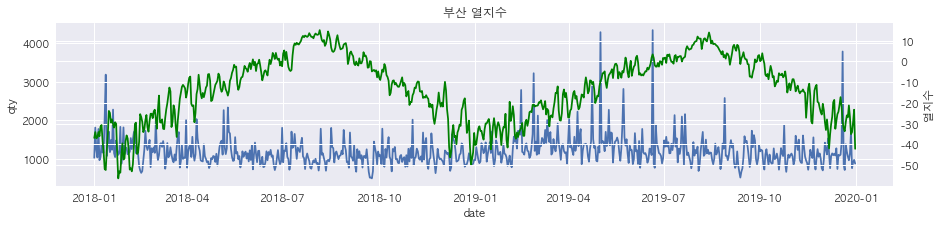

In [21]:
weather_qty_graph(cluster_buy_df(1), "부산")

<Figure size 1440x432 with 0 Axes>

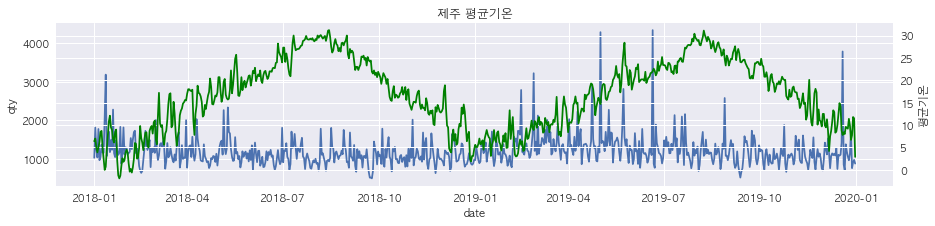

<Figure size 1440x432 with 0 Axes>

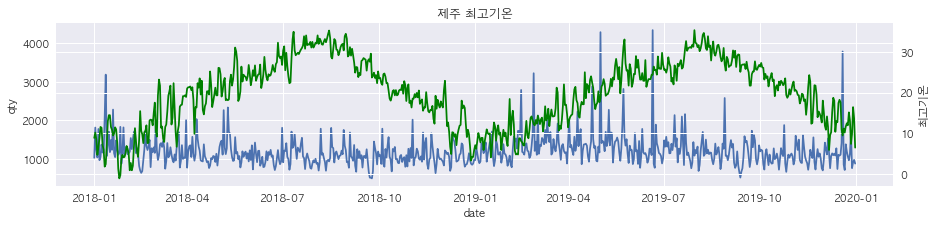

<Figure size 1440x432 with 0 Axes>

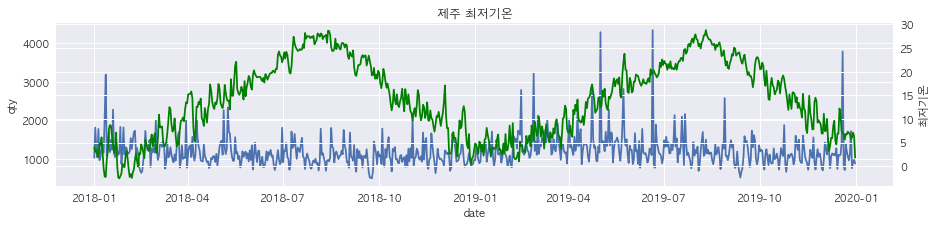

<Figure size 1440x432 with 0 Axes>

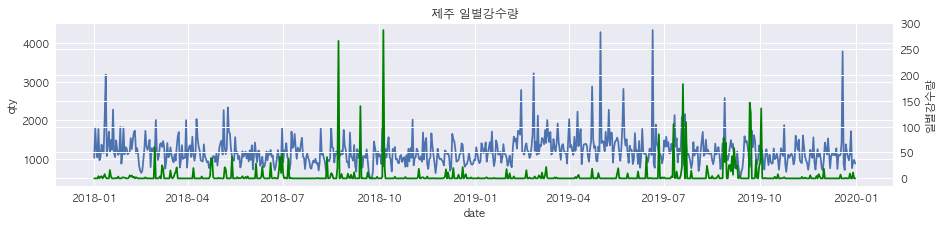

<Figure size 1440x432 with 0 Axes>

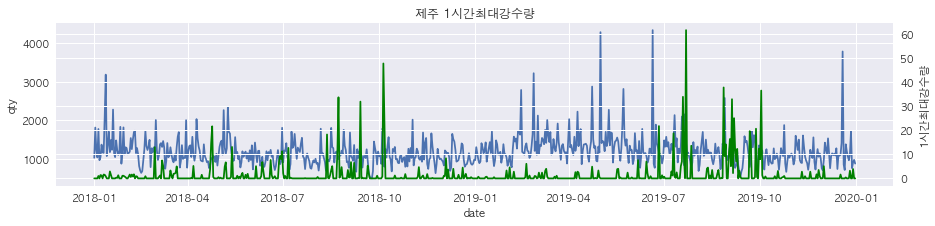

<Figure size 1440x432 with 0 Axes>

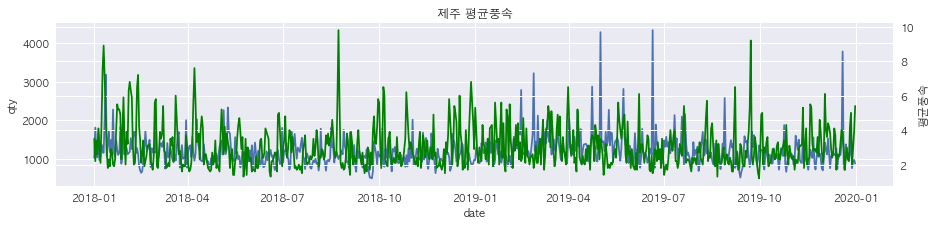

<Figure size 1440x432 with 0 Axes>

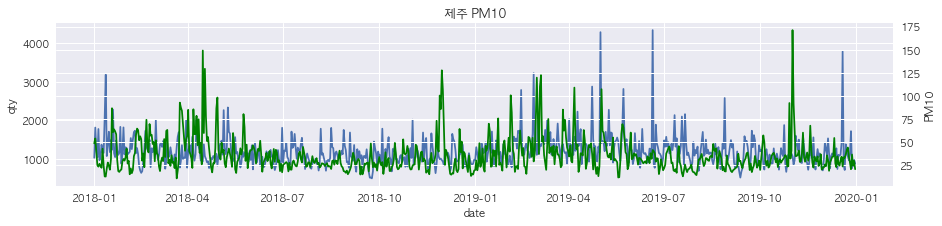

<Figure size 1440x432 with 0 Axes>

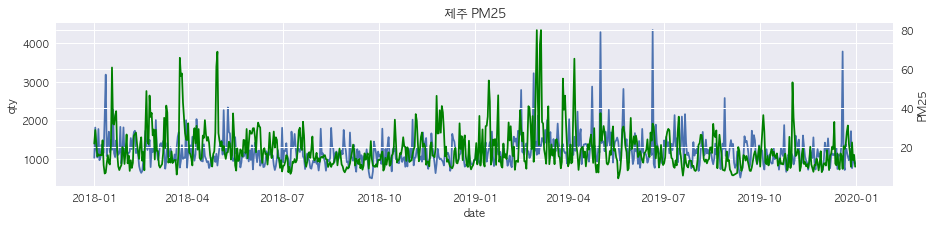

<Figure size 1440x432 with 0 Axes>

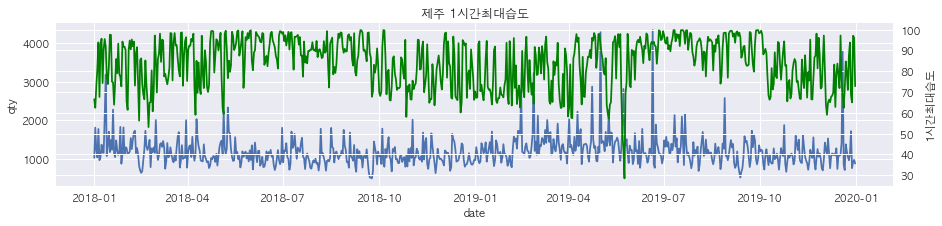

<Figure size 1440x432 with 0 Axes>

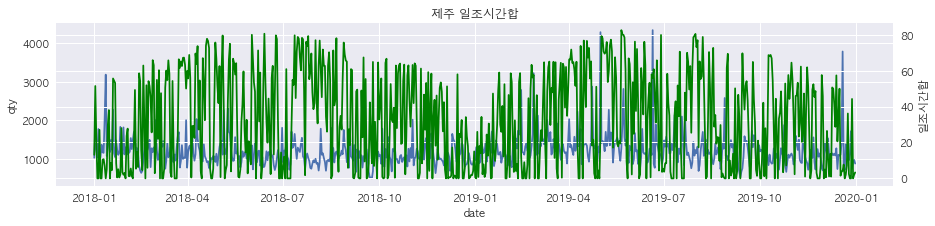

<Figure size 1440x432 with 0 Axes>

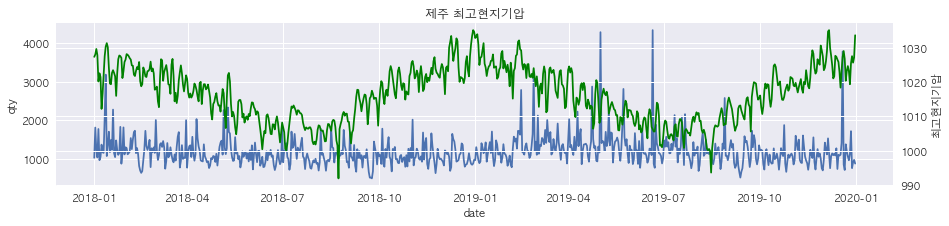

<Figure size 1440x432 with 0 Axes>

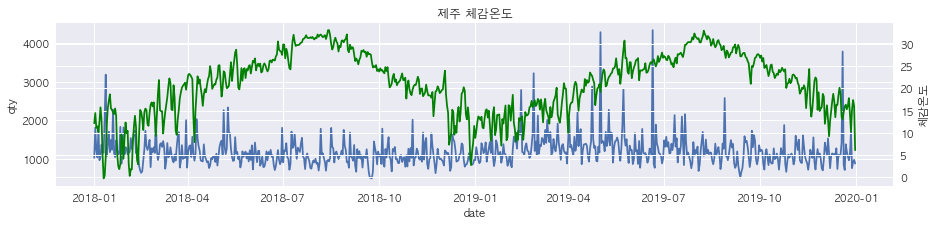

<Figure size 1440x432 with 0 Axes>

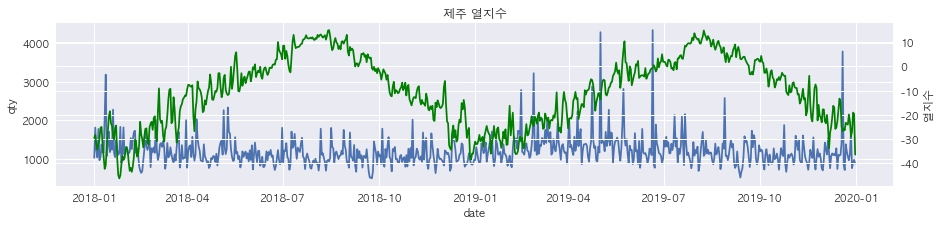

In [22]:
weather_qty_graph(cluster_buy_df(1), "제주")

# 3. Cluster2 : 여름
* 서울 + 대구 (기온 1등, 강수량 양의 상관관계, 열지수 1등), 강릉 (기온 높, 미먼 상관관계 젤 높음, 일조시간 높은 편, 체감온도 높, 열지수 높)

In [16]:
display_weather_correlation(cluster_buy_df(2))

,강릉,인천,수원,안동,울산,제주,천안,청주,대구,창원,여수,부산,서울,광주,전주,대전
평균기온,0.348154,0.305299,0.333190,0.354273,0.323345,0.267953,0.344869,0.353742,0.358271,0.313742,0.289559,0.287367,0.339772,0.325343,0.325575,0.350588
최고기온,0.352917,0.316962,0.350954,0.363560,0.334579,0.288170,0.355174,0.366556,0.366585,0.337709,0.299706,0.281851,0.348719,0.340166,0.343887,0.364099
최저기온,0.321855,0.298797,0.305341,0.299078,0.295188,0.251764,0.298835,0.322415,0.316637,0.284610,0.272067,0.282658,0.315879,0.293403,0.295116,0.313115
일별강수량,-0.013911,0.028492,0.027241,0.013468,0.001468,-0.015354,-0.003920,0.005889,-0.013879,0.034084,0.040628,0.022235,0.062470,0.008550,0.013622,-0.011160
1시간최대강수량,0.010576,0.038807,0.043199,0.037079,0.014876,-0.007963,0.030426,0.022966,0.011956,0.020346,0.044342,0.017516,0.083183,-0.000153,0.032511,0.008376
평균풍속,-0.069230,-0.058074,0.096571,0.068180,-0.100706,-0.082708,0.106241,0.121490,0.029422,-0.002040,-0.116298,0.137386,0.007847,0.076201,0.057579,0.149689
PM10,0.169877,0.040728,0.065065,0.056294,0.122928,0.041198,0.004086,-0.010419,0.012765,0.036087,0.055781,0.086372,0.074295,0.038636,-0.046809,-0.009386
PM25,0.054587,0.031390,0.017326,-0.103405,0.130527,0.041608,-0.004488,-0.057439,-0.018262,0.051173,0.046637,0.089985,0.065970,-0.011057,-0.089804,-0.033995
1시간최대습도,0.083655,0.203233,0.048847,0.022502,0.116544,0.078817,0.051351,-0.095213,0.017979,0.151138,0.213571,0.175907,0.044435,0.058865,0.027489,-0.053679
일조시간합,0.102512,0.080434,0.079411,0.135940,0.128277,0.198149,0.111341,0.098155,0.089317,0.108480,0.101808,0.099497,0.106805,0.088692,0.095565,0.107732


<Figure size 1440x432 with 0 Axes>

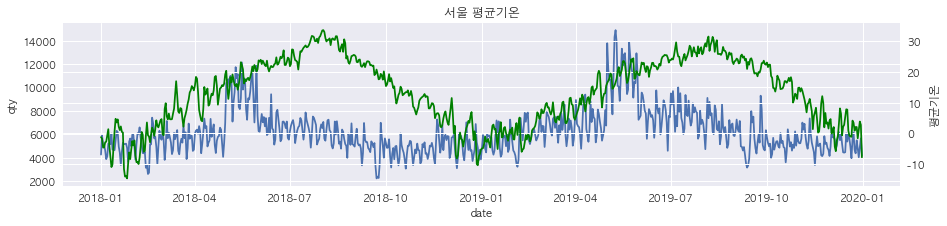

<Figure size 1440x432 with 0 Axes>

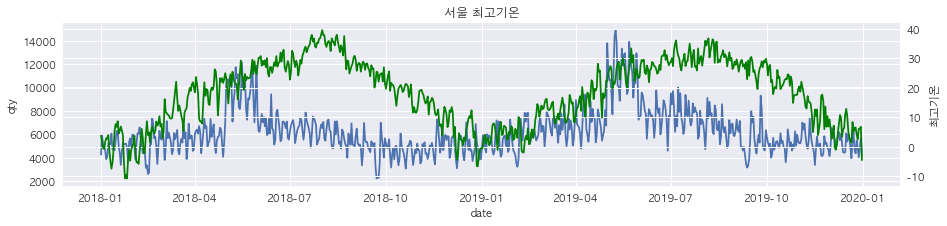

<Figure size 1440x432 with 0 Axes>

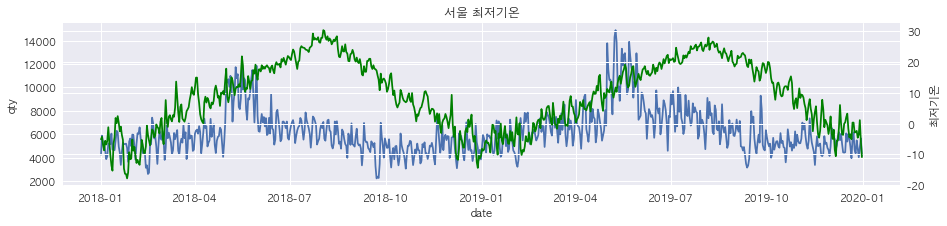

<Figure size 1440x432 with 0 Axes>

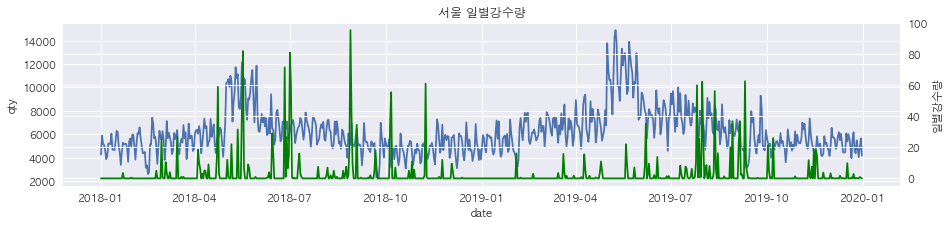

<Figure size 1440x432 with 0 Axes>

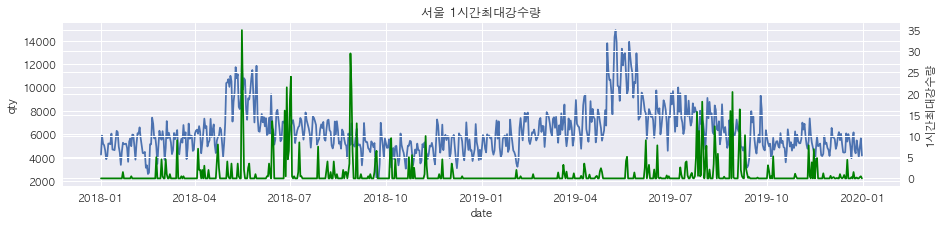

<Figure size 1440x432 with 0 Axes>

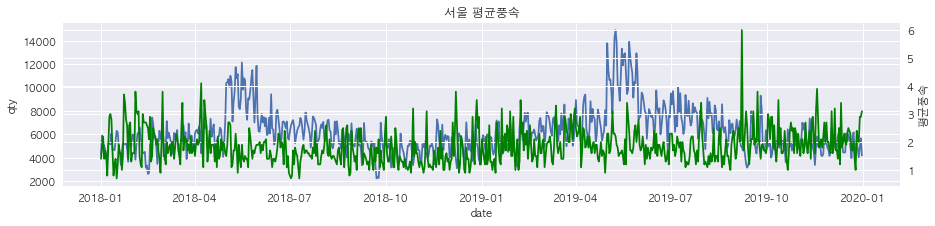

<Figure size 1440x432 with 0 Axes>

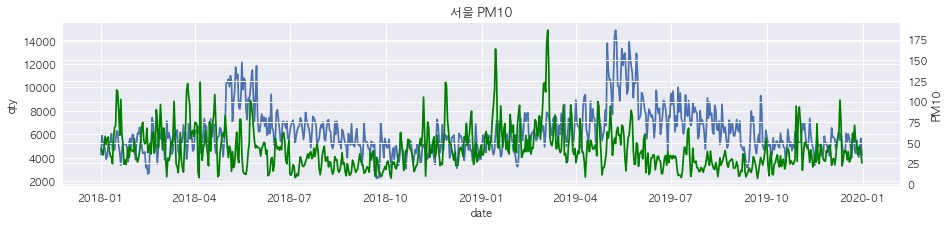

<Figure size 1440x432 with 0 Axes>

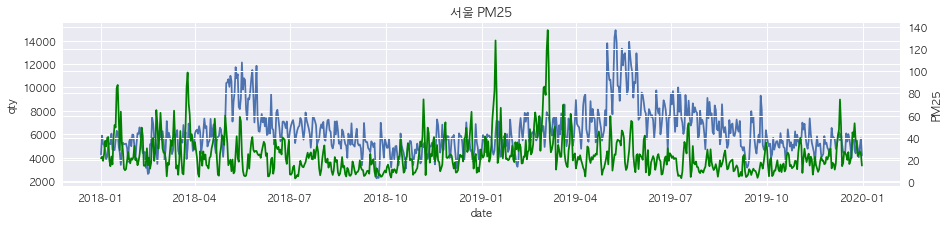

<Figure size 1440x432 with 0 Axes>

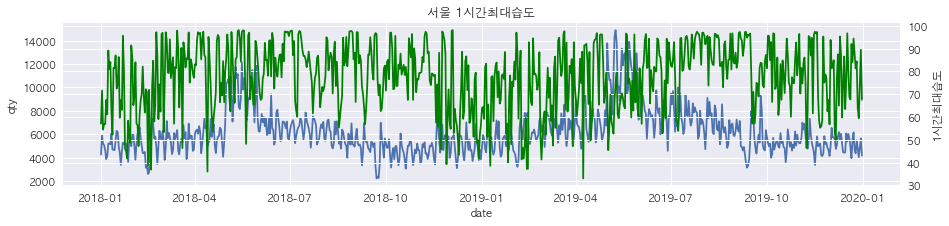

<Figure size 1440x432 with 0 Axes>

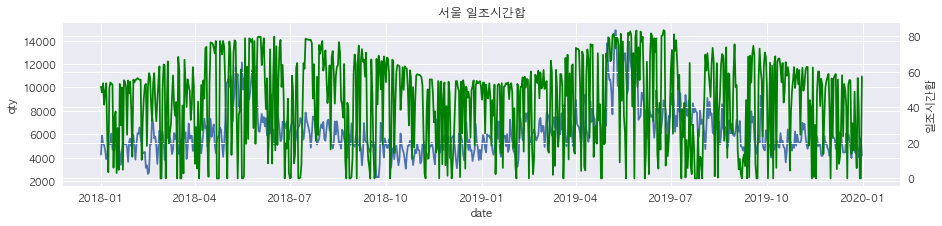

<Figure size 1440x432 with 0 Axes>

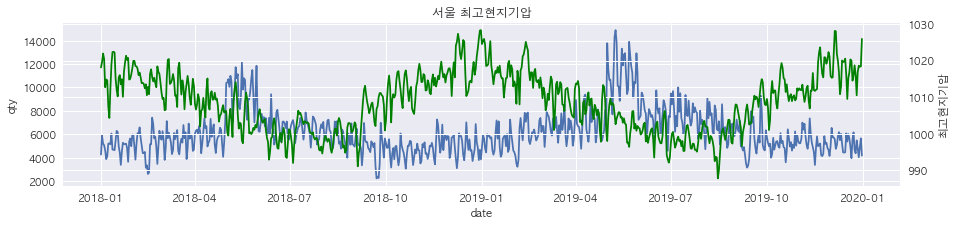

<Figure size 1440x432 with 0 Axes>

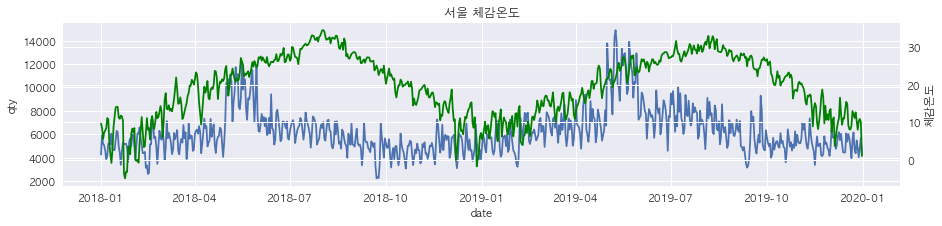

<Figure size 1440x432 with 0 Axes>

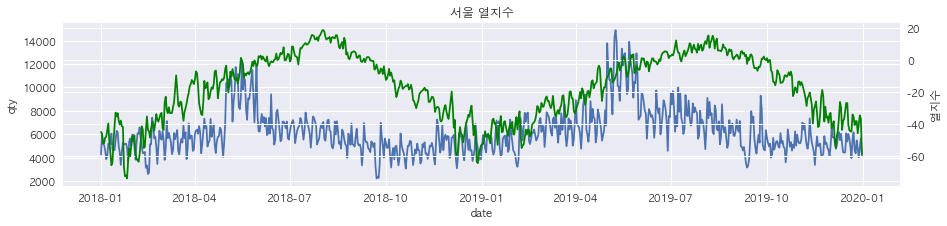

In [17]:
weather_qty_graph(cluster_buy_df(2), "서울")

<Figure size 1440x432 with 0 Axes>

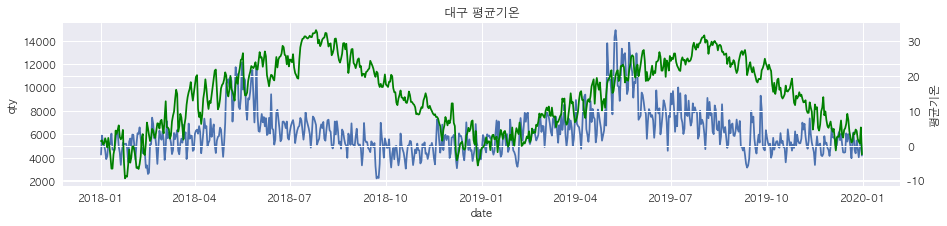

<Figure size 1440x432 with 0 Axes>

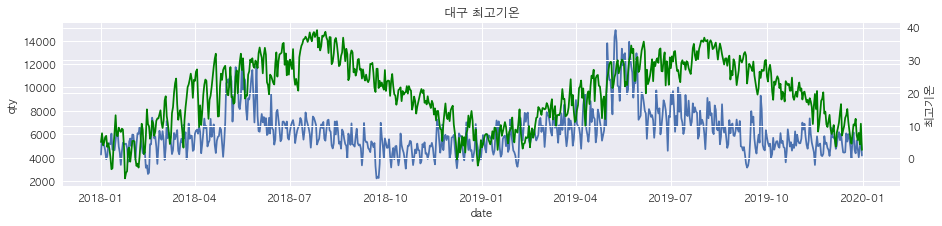

<Figure size 1440x432 with 0 Axes>

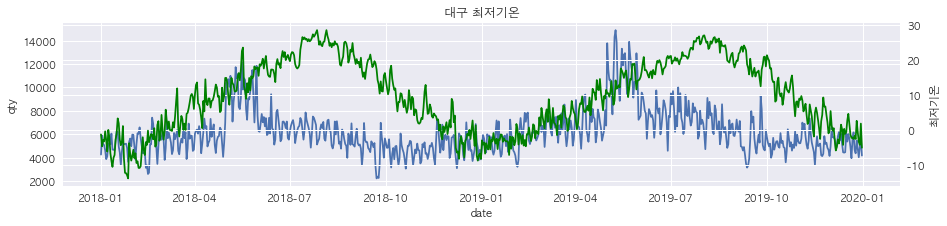

<Figure size 1440x432 with 0 Axes>

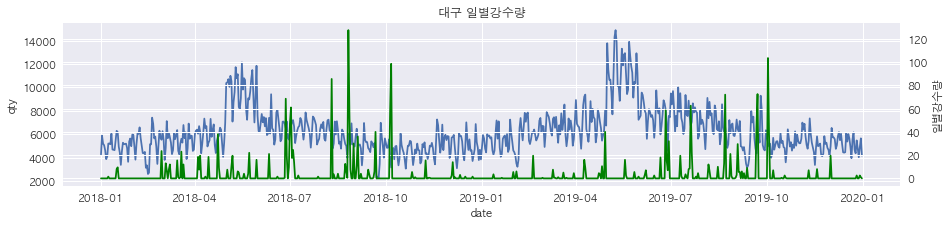

<Figure size 1440x432 with 0 Axes>

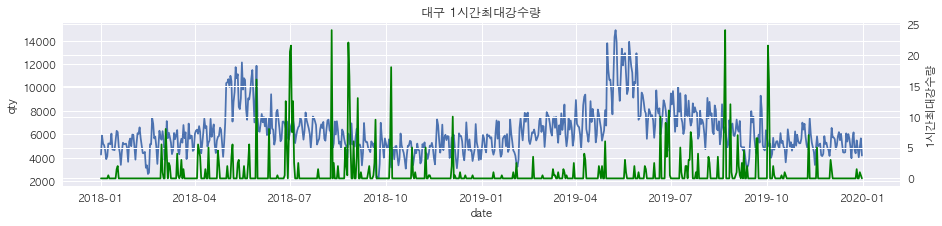

<Figure size 1440x432 with 0 Axes>

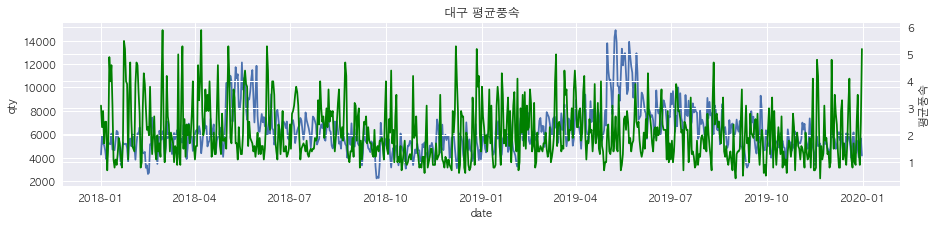

<Figure size 1440x432 with 0 Axes>

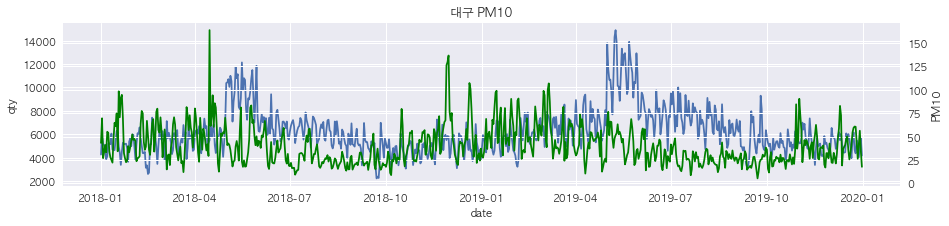

<Figure size 1440x432 with 0 Axes>

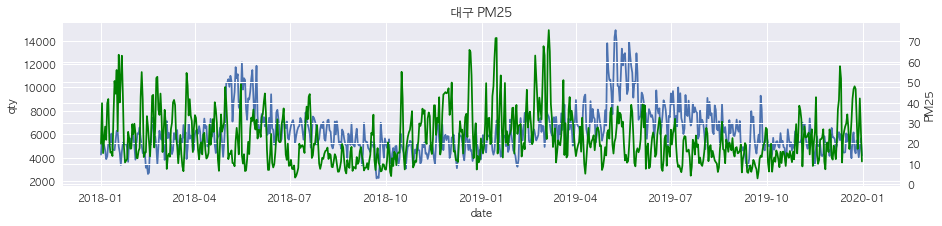

<Figure size 1440x432 with 0 Axes>

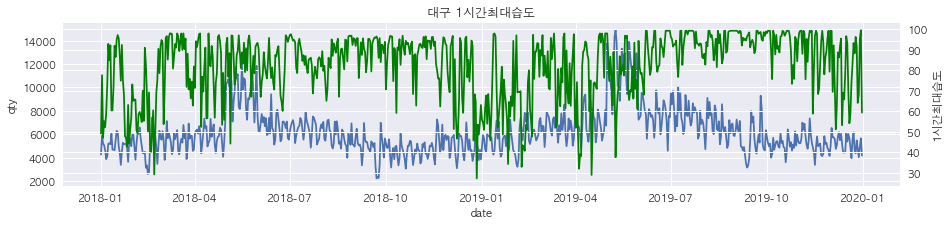

<Figure size 1440x432 with 0 Axes>

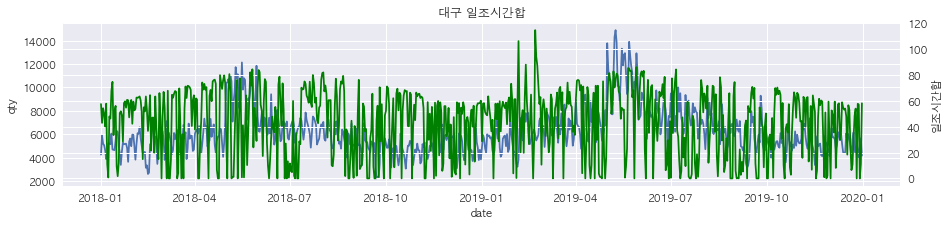

<Figure size 1440x432 with 0 Axes>

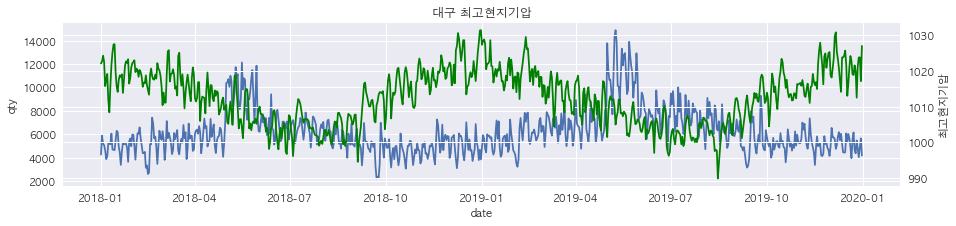

<Figure size 1440x432 with 0 Axes>

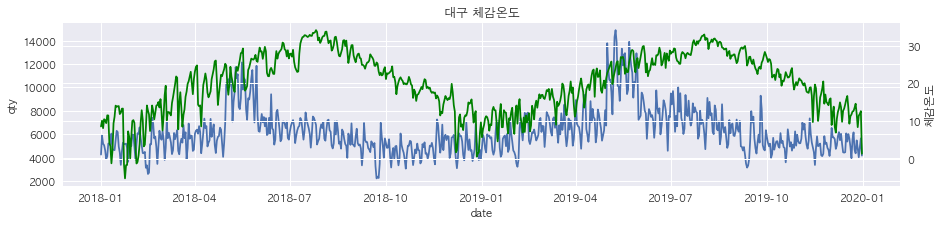

<Figure size 1440x432 with 0 Axes>

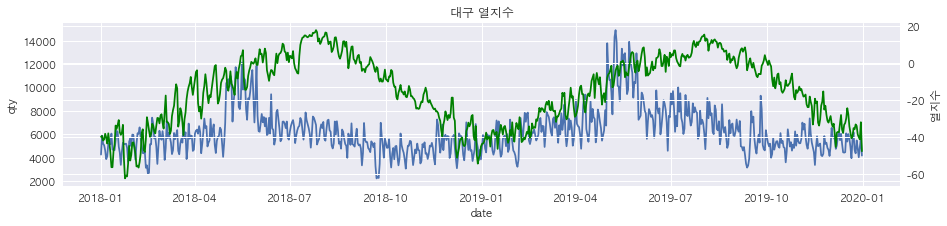

In [18]:
weather_qty_graph(cluster_buy_df(2), "대구")

<Figure size 1440x432 with 0 Axes>

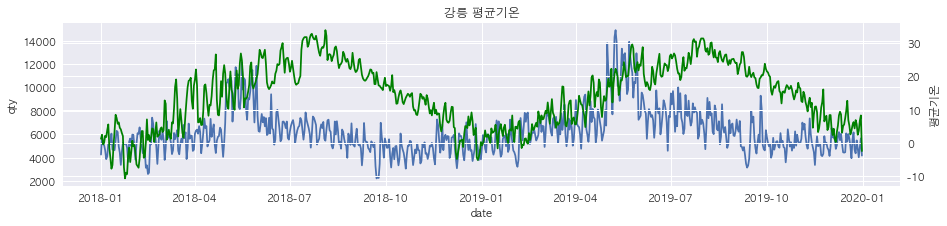

<Figure size 1440x432 with 0 Axes>

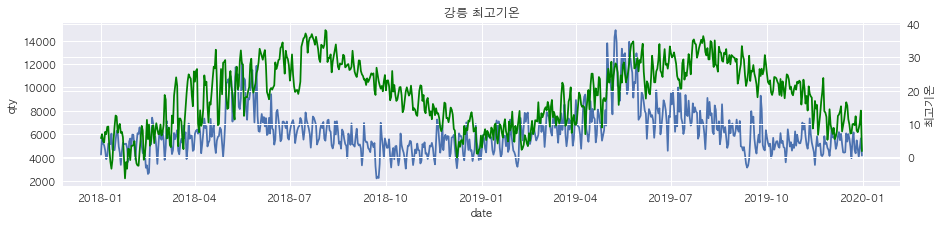

<Figure size 1440x432 with 0 Axes>

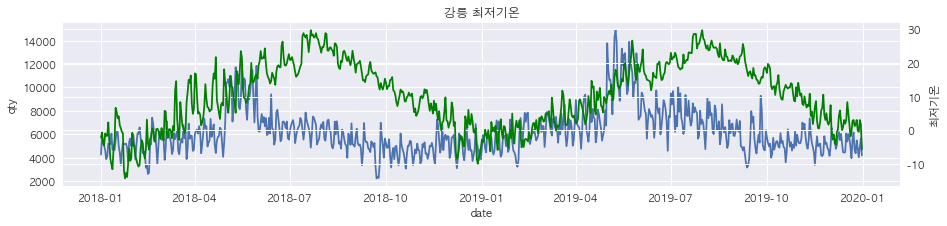

<Figure size 1440x432 with 0 Axes>

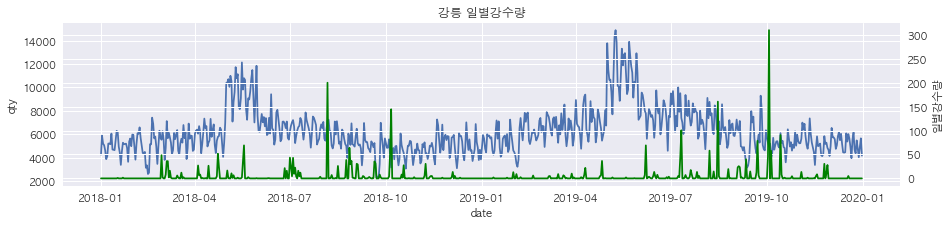

<Figure size 1440x432 with 0 Axes>

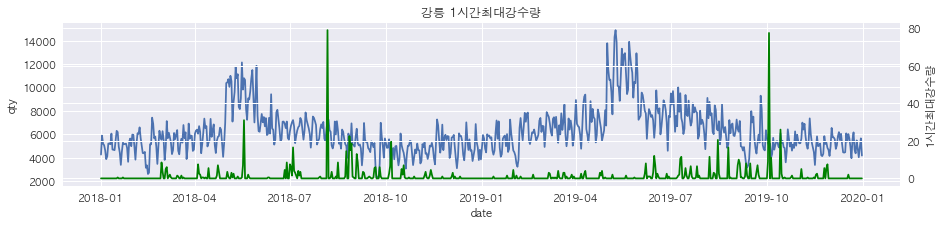

<Figure size 1440x432 with 0 Axes>

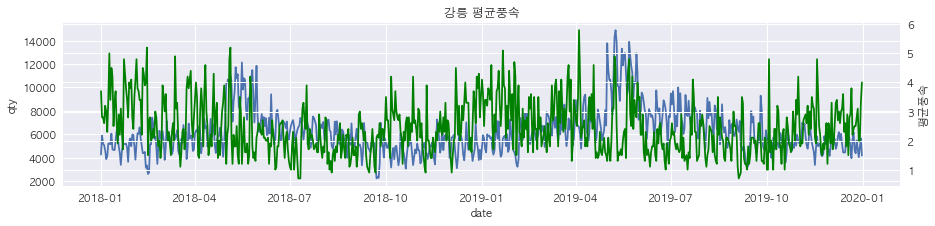

<Figure size 1440x432 with 0 Axes>

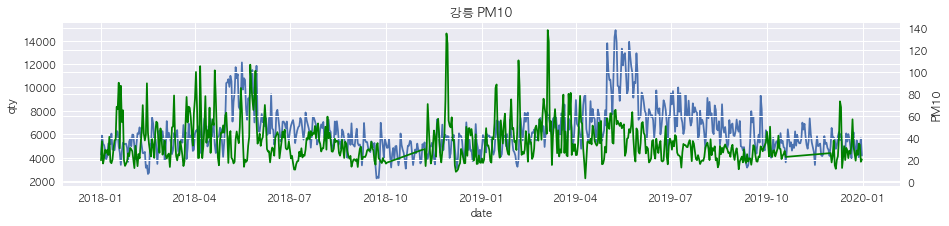

<Figure size 1440x432 with 0 Axes>

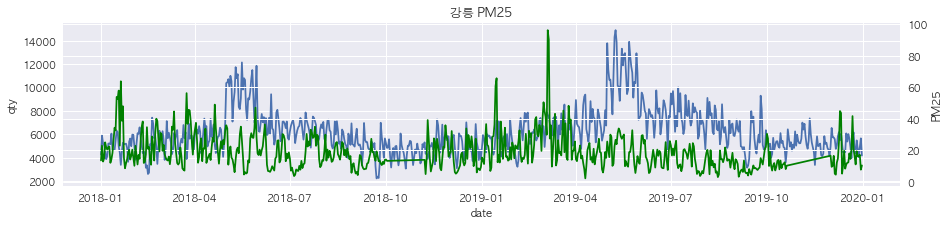

<Figure size 1440x432 with 0 Axes>

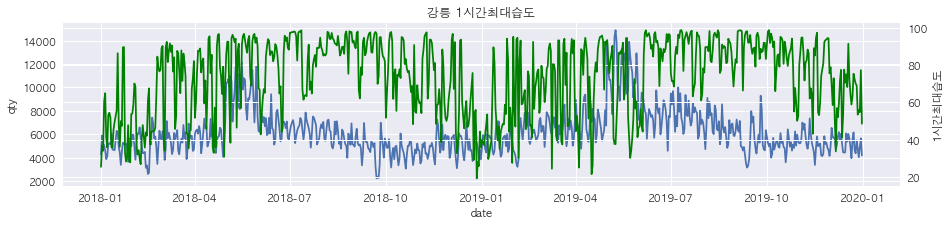

<Figure size 1440x432 with 0 Axes>

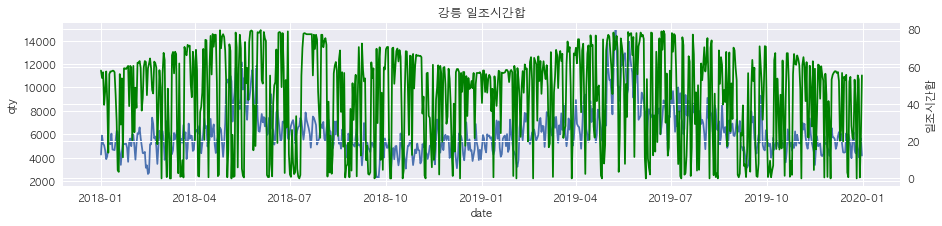

<Figure size 1440x432 with 0 Axes>

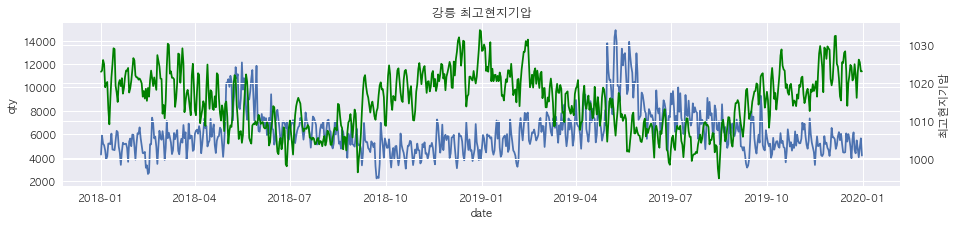

<Figure size 1440x432 with 0 Axes>

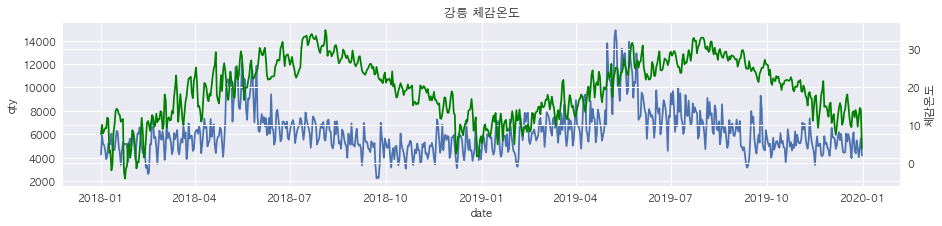

<Figure size 1440x432 with 0 Axes>

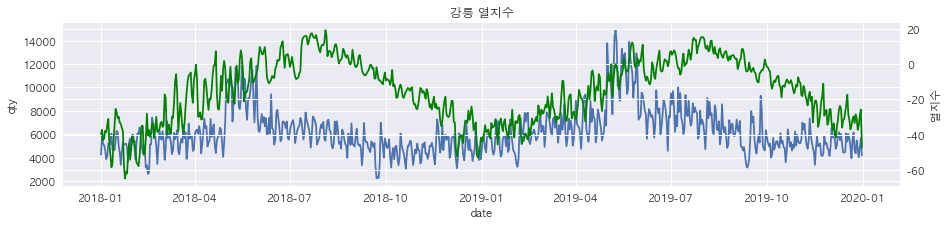

In [19]:
weather_qty_graph(cluster_buy_df(2), "강릉")